<a href="https://colab.research.google.com/github/emilia-szymanska/mask_detection_and_classification/blob/master/YOLO_mask_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

This notebook provides code for a YOLOv5 neural network which - after training - detects and classifies people faces in three classes: wearing a mask, not wearing it or wearing it improperly. [Dataset](https://www.kaggle.com/andrewmvd/face-mask-detection) is taken from Kaggle - follow the complementary notebook for downloading Kaggle dataset to Google Drive.  

## Prerequisites

In [ ]:
# import necessary libraries and functions
import os
import numpy as np
from pathlib import Path
from xml.dom.minidom import parse
from shutil import copyfile
from sklearn.model_selection import train_test_split
from glob import glob
import matplotlib.pyplot as plt
from IPython.display import Image, display

In [ ]:
# define paths to directories with root dataset and destination dataset direcory
DATASET_ROOT = "/content/gdrive/My Drive/Kaggle/mask_detection_853/"
IMAGES_ROOT = DATASET_ROOT + "images"
ANNOTATIONS_ROOT = DATASET_ROOT + "annotations"

DATA_DIR = "/content/data/"
LABELS_DIR = DATA_DIR + "labels"
LABELS_TMP_DIR = "/content/labels_tmp"
IMAGES_DIR = DATA_DIR + "images"

In [ ]:
# mount Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
# navigate to content directory, create directories for dataset and download yolo network 
%cd /content/
!mkdir -p data/labels
!mkdir -p data/images
!mkdir labels_tmp
!git clone https://github.com/ultralytics/yolov5

/content
Cloning into 'yolov5'...
remote: Enumerating objects: 6303, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 6303 (delta 8), reused 8 (delta 1), pack-reused 6281
Receiving objects: 100% (6303/6303), 8.56 MiB | 25.47 MiB/s, done.
Resolving deltas: 100% (4310/4310), done.


These names of classes are defined in xml files (not my choice that it is 'weared' instead of 'worn').

In [36]:
!pip install -r /content/yolov5/requirements.txt

In [ ]:
# class names
classes = ['with_mask', 'without_mask', 'mask_weared_incorrect']

## Dataset conversion from COCO to YOLO format 

In [20]:
def create_txt_from_xml(annotations_path, xml_filename):
    '''
    Function converting COCO format to YOLO format
    '''
    xml_filename_split = xml_filename.split(".")
    filename = xml_filename_split[0]
    xml_filepath = annotations_path + '/' + xml_filename
    class_bounding_boxes = parse_xml(xml_filepath)
    save_to_txt(filename, class_bounding_boxes)


def save_to_txt(filename, class_bounding_boxes):
    '''
    Function creating a txt label file corresponding to the image
    given by filename for specific list of class ids and correspondnig
    bounding boxes
    '''
    new_filename = LABELS_TMP_DIR + '/' + filename + '.txt'
    print(f"Saving to {new_filename}")
    file_path = open(new_filename, "a+")
    for box in class_bounding_boxes:
        class_id = box[0]
        x = box[1]
        y = box[2]
        w = box[3]
        h = box[4]
        file_path.write(f"{class_id} {x} {y} {w} {h}\n")
    file_path.flush()
    file_path.close()


def parse_xml(xml_filepath):
    '''
    Function parsing xml file to a list of [class_id, x, y, w, h]
    in YOLO format
    '''
    dom = parse(xml_filepath)
    root = dom.documentElement
    name = root.getElementsByTagName("filename")[0].childNodes[0].data
    size = root.getElementsByTagName("size")[0]
    objects = root.getElementsByTagName("object")
    width = size.getElementsByTagName("width")[0].childNodes[0].data
    height = size.getElementsByTagName("height")[0].childNodes[0].data
    depth = size.getElementsByTagName("depth")[0].childNodes[0].data
    class_bounding_boxes = []
    
    for obj in objects:
        class_name = obj.getElementsByTagName("name")[0].childNodes[0].data
        x_min = int(obj.getElementsByTagName("xmin")[0].childNodes[0].data)
        y_min = int(obj.getElementsByTagName("ymin")[0].childNodes[0].data)
        x_max = int(obj.getElementsByTagName("xmax")[0].childNodes[0].data)
        y_max = int(obj.getElementsByTagName("ymax")[0].childNodes[0].data)
        tmp_box = [x_min, y_min, x_max, y_max]
        [x, y, w, h] = convert_to_coords([width, height], tmp_box)
        class_id = classes.index(class_name)
        class_bounding_boxes.append([class_id, x, y, w, h])
    
    return class_bounding_boxes


def convert_to_coords(size, box):
    '''
    Function converting a bounding box given by [(x_min, y_min), (x_max, y_max)] 
    and a size [dw, dh] to [x, y, w, h] format
    '''
    x_min = int(box[0])
    y_min = int(box[1])
    x_max = int(box[2])
    y_max = int(box[3])

    dw = np.float32(1. / int(size[0]))
    dh = np.float32(1. / int(size[1]))

    w = x_max - x_min
    h = y_max - y_min
    x = (x_min + (w / 2)) * dw
    y = (y_min + (h / 2)) * dh
    w = w * dw
    h = h * dh

    return [x, y, w, h]

In [21]:
# converting XML files to TXT
annotations = os.listdir(ANNOTATIONS_ROOT)
for file in annotations:
    print("file name: ", file)
    create_txt_from_xml(ANNOTATIONS_ROOT, file)

file name:  maksssksksss0.xml
Saving to /content/labels_tmp/maksssksksss0.txt
file name:  maksssksksss1.xml
Saving to /content/labels_tmp/maksssksksss1.txt
file name:  maksssksksss108.xml
Saving to /content/labels_tmp/maksssksksss108.txt
file name:  maksssksksss106.xml
Saving to /content/labels_tmp/maksssksksss106.txt
file name:  maksssksksss104.xml
Saving to /content/labels_tmp/maksssksksss104.txt
file name:  maksssksksss100.xml
Saving to /content/labels_tmp/maksssksksss100.txt
file name:  maksssksksss101.xml
Saving to /content/labels_tmp/maksssksksss101.txt
file name:  maksssksksss110.xml
Saving to /content/labels_tmp/maksssksksss110.txt
file name:  maksssksksss109.xml
Saving to /content/labels_tmp/maksssksksss109.txt
file name:  maksssksksss105.xml
Saving to /content/labels_tmp/maksssksksss105.txt
file name:  maksssksksss107.xml
Saving to /content/labels_tmp/maksssksksss107.txt
file name:  maksssksksss103.xml
Saving to /content/labels_tmp/maksssksksss103.txt
file name:  maksssksksss

In [24]:
# dividing dataset into train, validation and test
image_list = os.listdir(IMAGES_ROOT)
train_list, test_list = train_test_split(image_list, test_size=0.2, random_state=7)
val_list, test_list = train_test_split(test_list, test_size=0.5, random_state=8)

print('total =',len(image_list))
print('train :',len(train_list))
print('val   :',len(val_list))
print('test  :',len(test_list))

total = 853
train : 682
val   : 85
test  : 86


In [32]:
def copy_data(file_list, labels_root, images_root, type):
    '''
    Copy labels and images from root directories to corresponing test/val/train 
    subdirectories in data directory
    '''
    img_target = Path(IMAGES_DIR + '/' + type)
    if not img_target.exists():
        print(f"Path {img_target} does not exist")
        os.makedirs(img_target)

    labels_target = Path(LABELS_DIR + '/' + type)
    if not labels_target.exists():
        print(f"Path {labels_target} does not exist")
        os.makedirs(labels_target)

    for file in file_list:
        filename = file.replace('.png', '.txt')
        img_src_file = images_root + '/' + file
        label_src_file = labels_root + '/' + filename
        # Copy images
        img_dict_file = IMAGES_DIR + '/' + type + '/' + file
        copyfile(img_src_file, img_dict_file)
        # Copy label
        lbl_dict_file = LABELS_DIR + '/' + type + '/' + filename
        copyfile(label_src_file, lbl_dict_file)

        

In [33]:
# copy labels and images to subdirectories
copy_data(train_list, LABELS_TMP_DIR, IMAGES_ROOT, "train")
copy_data(val_list,   LABELS_TMP_DIR, IMAGES_ROOT, "val")
copy_data(test_list,  LABELS_TMP_DIR, IMAGES_ROOT, "test")

## Creating .yaml file and training the network

In [34]:
# create yaml file defining YOLOv5 traning way
%cd /content/yolov5/
!echo "train: ../data/images/train" > data/facemask.yaml
!echo "val:   ../data/images/val" >> data/facemask.yaml
!echo "nc : 3" >> data/facemask.yaml
!echo "names: ['mask', 'no_mask', 'incorrect_mask']" >> data/facemask.yaml

!cat data/facemask.yaml

/content/yolov5
train: ../data/images/train
val:   ../data/images/val
nc : 3
names: ['mask', 'no_mask', 'incorrect_mask']


In [ ]:
# train with default YOLOv5s weights
%cd /content/yolov5/
!python train.py --img 320 --batch 16 --epochs 50 --data data/facemask.yaml --cfg models/yolov5s.yaml --weights yolov5s.pt

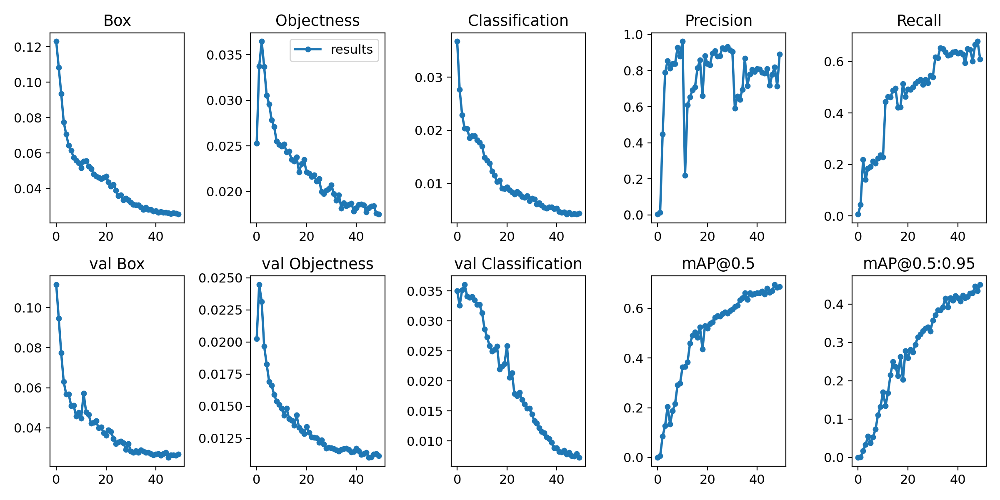

In [ ]:
# plot results - it might need importing the function

plot_results(save_dir='runs/train/exp')
Image(filename='runs/train/exp/results.png', width=800)

## Detecting on test images

It might be necessary to replace */exp/* part of paths to */epx2/*, */exp3/* etc...

In [ ]:
# detect bounding boxes and classes on test images
!python detect.py --source ../data/images/test --img-size 320 --conf 0.4 --weights runs/train/exp/weights/best.pt

Namespace(agnostic_nms=False, augment=False, classes=None, conf_thres=0.4, device='', exist_ok=False, hide_conf=False, hide_labels=False, img_size=320, iou_thres=0.45, line_thickness=3, name='exp', nosave=False, project='runs/detect', save_conf=False, save_crop=False, save_txt=False, source='../data/images/test', update=False, view_img=False, weights=['runs/train/exp2/weights/best.pt'])
YOLOv5 🚀 v5.0-91-g17b0f71 torch 1.8.1+cu101 CPU

Fusing layers... 
Model Summary: 224 layers, 7059304 parameters, 0 gradients
image 1/86 /content/yolov5/../data/images/test/maksssksksss10.png: 320x256 1 mask, Done. (0.112s)
image 2/86 /content/yolov5/../data/images/test/maksssksksss131.png: 224x320 5 masks, 2 no_masks, Done. (0.095s)
image 3/86 /content/yolov5/../data/images/test/maksssksksss146.png: 224x320 3 masks, Done. (0.090s)
image 4/86 /content/yolov5/../data/images/test/maksssksksss153.png: 224x320 1 mask, 1 no_mask, Done. (0.092s)
image 5/86 /content/yolov5/../data/images/test/maksssksksss16.pn

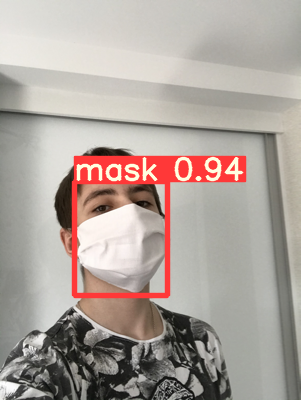

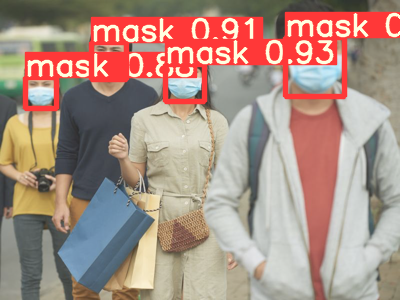

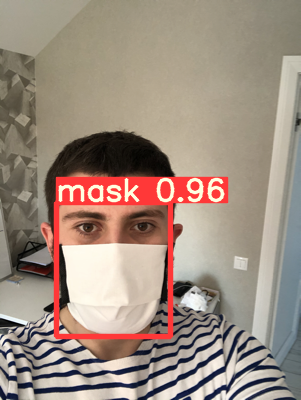

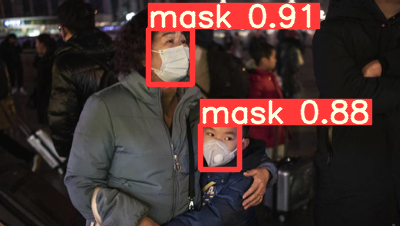

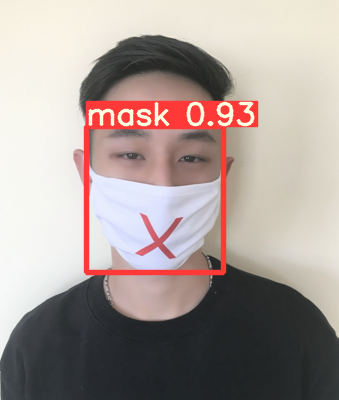

...

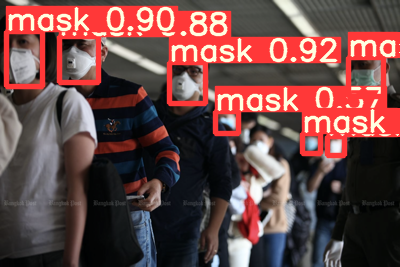

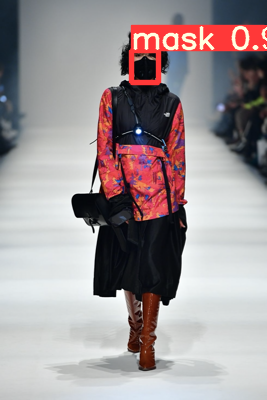

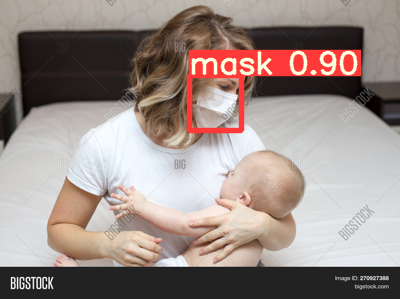

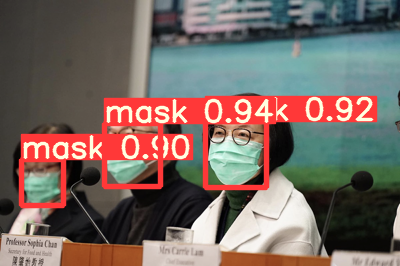

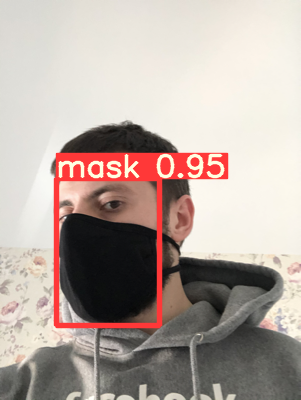

In [ ]:
# display test images
for imageName in glob('/content/yolov5/runs/detect/exp/*.png'):
    display(Image(filename=imageName))
    print("\n")

In [ ]:
# use this command to detect images with web camera
#!python detect.py --source 0 --conf 0.4 --weights runs/train/exp2/weights/best.pt

## Save test images and weights

In [ ]:
# save weights
%cp /content/yolov5/runs/train/exp/weights/best.pt /content/gdrive/My\ Drive/mask_detection/

In [ ]:
# save images from test set
%cp -r /content/yolov5/runs/detect/exp/ /content/gdrive/My\ Drive/mask_detection/